In [108]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import time
from IPython import display
from tensorflow.keras.utils import Sequence
from keras import backend as K
import segmentation_models as sm
sm.set_framework('tf.keras')
'''import pydot
import graphviz
from keras.utils import plot_model'''

Segmentation Models: using `keras` framework.


'import pydot\nimport graphviz\nfrom keras.utils import plot_model'

In [2]:
class DataGenerator(Sequence):
    def __init__(self, list_IDs,label_map , img_dir ,mode):
        'Initialization'
        self.list_IDs = list_IDs
        self.label_map = image_label_map
        self.on_epoch_end()
        self.img_dir = img_dir + "/images"
        self.mask_dir = img_dir + "/masks"
        self.mode = mode

    def __len__(self):
        return int(len(self.list_IDs))

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
    
    def __getitem__(self, index):
        'Generate one batch of data'
        indexes = self.indexes[index:(index+1)]
        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        # Generate data
        X, y = self.__data_generation(list_IDs_temp)
        return X, y    
    
    def __data_generation(self, list_IDs_temp):
        """Generates data containing batch_size samples"""
        if self.mode == "train":
            # Generate data
            X, y = self.load_file(list_IDs_temp)
            return X, y
        elif self.mode == "val":
            X, y = self.load_file(list_IDs_temp)
            return X, y        
        
    def load_file(self, id_list):
        list_IDs_temp = id_list
        for ID in list_IDs_temp:
            x_file_path = os.path.join(self.img_dir, ID)
            y_file_path = os.path.join(self.mask_dir, self.label_map.get(ID))
            # Store sample
            X = np.load(x_file_path)
            #X = np.int64(X*255)
            # Store class
            y = np.load(y_file_path).astype('float32')
        return X, y

In [3]:
out_train_data_dir = '/home/hgamarro/DeepLearning/HG_space/data/processed/Vegas/train'
out_val_data_dir = '/home/hgamarro/DeepLearning/HG_space/data/processed/Vegas/val'


# ====================
# train set
# ====================
all_files = [s for s in os.listdir(out_train_data_dir + "/images/") if s.endswith('.npy')]
all_files.append([s for s in os.listdir(out_train_data_dir + "/masks/") if s.endswith('.npy')] )

image_label_map = {
        "image_file_{}.npy".format(i+1): "label_file_{}.npy".format(i+1)
        for i in range(int(len(all_files)))}
partition = [item for item in all_files if "image_file" in item]

# ====================
# validation set
# ====================
all_val_files = [s for s in os.listdir(out_val_data_dir + "/images/") if s.endswith('.npy')]
all_val_files.append([s for s in os.listdir(out_val_data_dir + "/masks/") if s.endswith('.npy')] )
val_image_label_map = {
        "image_file_{}.npy".format(i+1): "label_file_{}.npy".format(i+1)
        for i in range(int(len(all_val_files)))
}
val_partition = [item for item in all_val_files if "image_file" in item]


#train_generator = DataGenerator(partition,image_label_map,out_train_data_dir, "train")
#val_generator= DataGenerator(val_partition,val_image_label_map,out_val_data_dir, "val")

In [4]:
#re ,inp = load(PATH+'train/100.jpg')
#flips mask and input image
re_inp = DataGenerator(partition,image_label_map,out_train_data_dir, "train")
val_re_inp= DataGenerator(val_partition,val_image_label_map,out_val_data_dir, "val")

In [5]:
len(re_inp)

91

In [6]:
for i in np.arange(len(re_inp)-88):
    print( re_inp[i][1][:,:,:,:].shape )
    print( re_inp[i][0][:,:,:,:].shape )

(32, 512, 512, 1)
(32, 512, 512, 3)
(32, 512, 512, 1)
(32, 512, 512, 3)
(32, 512, 512, 1)
(32, 512, 512, 3)
(32, 512, 512, 1)
(32, 512, 512, 3)
(32, 512, 512, 1)
(32, 512, 512, 3)


In [7]:
def Generator_loop_mask(inp):
    for i in np.arange(len(re_inp)):        
        for j in np.arange(re_inp[i][0][:,:,:,:].shape[0]):
            yield tf.cast(re_inp[i][1][j,:,:,:] , tf.float32)

def Generator_loop_image(inp):
    for i in np.arange(len(re_inp)):
        for j in np.arange(re_inp[i][0][:,:,:,:].shape[0]):
            yield tf.cast(re_inp[i][1][j,:,:,:] , tf.float32)

In [8]:
for i in np.arange(len(re_inp) -89):
    for j in np.arange(re_inp[i][0][:,:,:,:].shape[0] -30):
        print( re_inp[i][0][j,:,:,:].shape)

(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


In [9]:
re_inp[0][0][0,:,:,:].shape

(512, 512, 3)

In [10]:
type(re_inp)

__main__.DataGenerator

In [67]:
inp3 =  re_inp[4][1][14,:,:,:]

In [68]:
inp2 =  re_inp[4][0][14,:,:,:]

In [69]:
type(inp2)

numpy.ndarray

In [70]:
inp = tf.cast(inp2, tf.float32)
type(inp)

tensorflow.python.framework.ops.EagerTensor

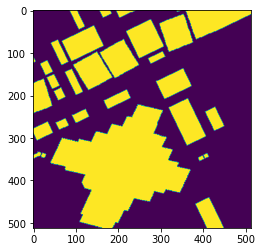

In [72]:
plt.imshow(inp3)

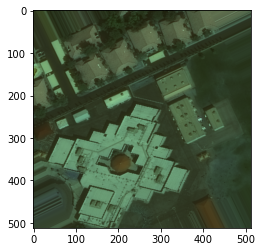

In [73]:
plt.imshow(inp2)

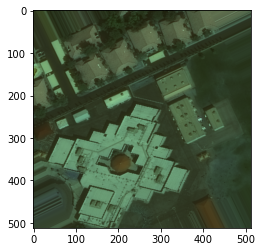

In [74]:
plt.imshow(inp)

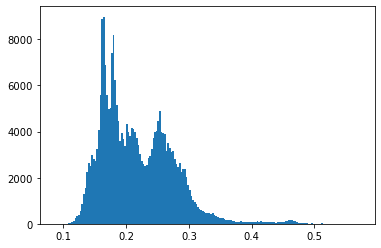

In [16]:
#fig, axes = plt.subplots(1, 3)#, figsize=(16, 5))
for a in np.arange(0,1):
    rng = inp2[:,:,a]
    rng = rng.reshape(rng.shape[0]*rng.shape[1])
    plt.hist(rng, bins='auto')
    plt.show

In [17]:
type(inp)

tensorflow.python.framework.ops.EagerTensor

In [15]:
OUTPUT_CHANNELS = 1

def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', 
                                      kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

down_model = downsample(3, 4) # check this out later about the error
#uses mask as input
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 256, 256, 3)


In [16]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [17]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 512, 512, 3)


In [36]:
K.clear_session()

def Generator():
    inputs = tf.keras.layers.Input(shape=[512, 512, 3])

    down_stack = [
        downsample(256, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
        downsample(128, 4),  # (bs, 64, 64, 128)
        downsample(256, 4),  # (bs, 32, 32, 256)
        downsample(128, 4),  # (bs, 16, 16, 512)
        downsample(64, 4),  # (bs, 8, 8, 512)
        downsample(64, 4),  # (bs, 4, 4, 512)
        downsample(256, 4),  # (bs, 2, 2, 512)
        downsample(512, 4),  # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
        upsample(512, 4),  # (bs, 16, 16, 1024)
        upsample(256, 4),  # (bs, 32, 32, 512)
        upsample(128, 4),  # (bs, 64, 64, 256)
        upsample(64, 4),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

Generator().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 256, 256, 256 12288       input_5[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 128, 128, 128 524800      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 64, 64, 256)  525312      sequential_1[0][0]               
______________________________________________________________________________________________

In [23]:
generator = Generator()
#tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [24]:
inp[tf.newaxis, ...].shape

TensorShape([1, 512, 512, 3])

(1, 512, 512, 1)


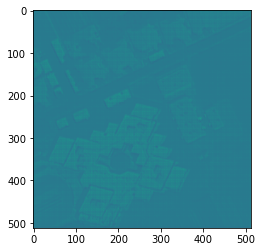

In [78]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
#gen_output = Generator_loop_mask(inp)
plt.imshow(gen_output[0, ...])
print(gen_output.shape)

In [29]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [30]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

In [37]:
#K.clear_session()
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=(512, 512, 3), name='input_image')
    tar = tf.keras.layers.Input(shape=(512, 512, 1), name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    down1 = downsample(256, 4)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(64, 4, False)(down2)  # (bs, 128, 128, 64)
    down4 = downsample(128, 4)(down3)  # (bs, 64, 64, 128)
    down5 = downsample(256, 4)(down4)  # (bs, 32, 32, 256)
    down6 = downsample(512, 4)(down5)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down6)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

Discriminator().summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 512, 512, 4)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, 256, 256, 256 17408       concatenate_7[0][0]        

In [39]:
discriminator = Discriminator()
#tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [75]:
inp[tf.newaxis, ...].shape

TensorShape([1, 512, 512, 3])

(1, 6, 6, 1)


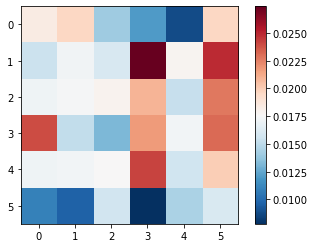

In [79]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
#disc_out = discriminator([inp, gen_output], training=False)
plt.imshow(disc_out[0, ..., -1]#, vmin=-20, vmax=20
    , cmap='RdBu_r'
          )
plt.colorbar()
print(disc_out.shape)

In [41]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [42]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [44]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [45]:
test_dataset = re_inp[0][0][0,:,:,:]

In [39]:
for i in np.arange(len(re_inp) -89):
    for j in np.arange(re_inp[i][0][:,:,:,:].shape[0] -30):
        print( re_inp[i][1][j,:,:,:].shape)
        print( re_inp[i][0][j,:,:,:].shape)

(512, 512, 1)
(512, 512, 3)
(512, 512, 1)
(512, 512, 3)
(512, 512, 1)
(512, 512, 3)
(512, 512, 1)
(512, 512, 3)


In [40]:
inp3.shape

(512, 512, 1)

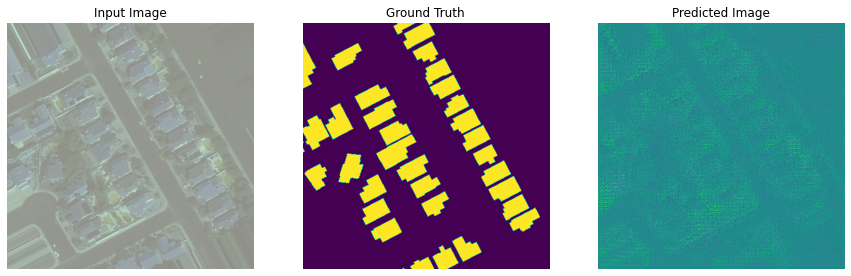

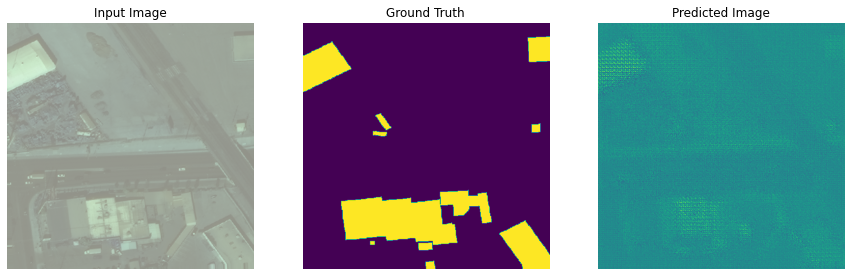

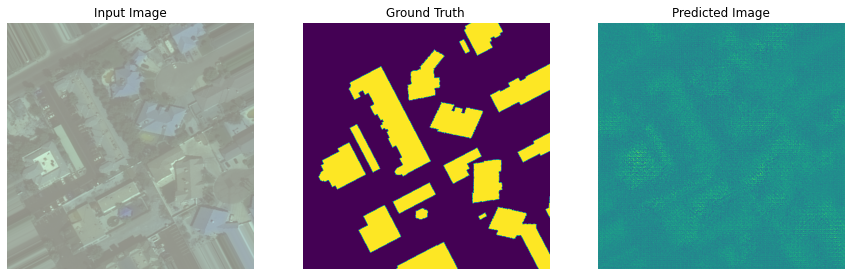

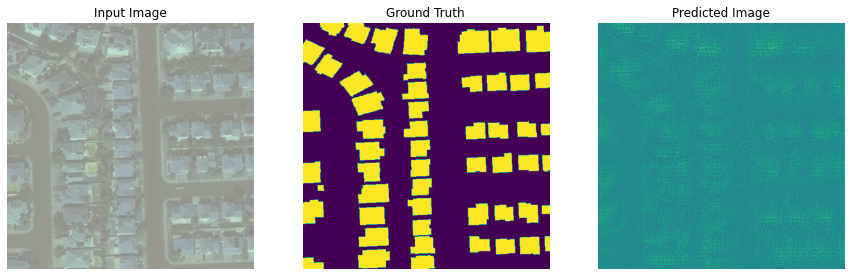

In [49]:
for i in np.arange(len(re_inp) -89):
    for j in np.arange(re_inp[i][0][:,:,:,:].shape[0] -30):
        generate_images( generator
                        , re_inp[i+52][0][tf.newaxis ,j,:,:,:]
                        , re_inp[i+52][1][tf.newaxis ,j,:,:,:])
        #print(re_inp[i][1][tf.newaxis ,j,:,:,:]).shape

for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

In [42]:
type(generator)

tensorflow.python.keras.engine.functional.Functional

In [47]:
EPOCHS = 10

model_andor_weight_path = "/home/hgamarro/DeepLearning/JB_space/models/pix2pix/"
checkpoint_dir = model_andor_weight_path+'logs/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

log_dir=model_andor_weight_path+"logs/"
summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.now().strftime("%Y%m%d-%H%M%S"))

@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        print(gen_output.shape)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

trainstep = train_step(re_inp[0][0][np.newaxis ,1,...] ,re_inp[0][1][np.newaxis ,1,...] ,1)
type(trainstep)
del trainstep

#this actually works to train
for input_image, target in zip(re_inp[i][0][tf.newaxis ,j,:,:,:]
                            ,re_inp[i][1][tf.newaxis ,j,:,:,:]):
    print(input_image.shape)
    print(type(input_image))
    print(target.shape)
    print(type(tf.cast(target, tf.float32)))
    train_step(tf.cast(input_image[tf.newaxis ,...] , tf.float32)
               , tf.cast(target[tf.newaxis ,...], tf.float32)
               , epoch=1
              )

In [46]:
type(re_inp[0][0])

numpy.ndarray

def fit(train_ds, epochs, test_ds):
    for epoch in range(epochs):
        start = time.time()

        display.clear_output(wait=True)

        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)

        # Train
        for n, (input_image, target) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            train_step(input_image, target, epoch)
        print()

        # saving (checkpoint) the model every 20 epochs
        if (epoch + 1) % 20 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
        checkpoint.save(file_prefix=checkpoint_prefix)

%load_ext tensorboard
%tensorboard --logdir {log_dir}

fit(train_dataset, EPOCHS, test_dataset)

In [47]:
model_andor_weight_path

'/home/hgamarro/DeepLearning/JB_space/models/pix2pix/'

In [84]:
if not os.path.isfile(model_andor_weight_path+"model_pix2pix_generator_base.h5"):
	generator.save(model_andor_weight_path+"model_pix2pix_generator_base.h5")
if not os.path.isfile(model_andor_weight_path+"model_pix2pix_discriminator_base.h5"):
	discriminator.save(model_andor_weight_path+"model_pix2pix_discriminator_base.h5")

train_step(re_inp[0][0][np.newaxis ,1,...] ,re_inp[0][1][np.newaxis ,1,...] ,1)

print(len(re_inp))
for inp_mask in re_inp:
    for batch in inp_mask:
        print(len(elem)
             )

In [ ]:
for inp_mask in re_inp:
    for batch in zip(inp_mask[0] , inp_mask[1]):
        print( batch[0][tf.newaxis ,...].shape)
        print( batch[1][tf.newaxis ,...].shape)
        print("//")

In [104]:
print("val_re_inp/test_ds len: " ,len(val_re_inp))

val_re_inp/test_ds len:  23


In [105]:
time.time()

1620281165.8739033

In [111]:
datetime.now() - datetime.now()

datetime.timedelta(days=-1, seconds=86399, microseconds=999998)

In [ ]:
def Fit(train_ds, epochs, test_ds):
    bs2 = test_ds[0][0][:,:,:,:].shape[0]
    bs1 = len(test_ds)
    
    for epoch in range(epochs):
        start = time.time()
        start1 = datetime.now()
        print("start: " ,start1)

        #display.clear_output(wait=True)
        for i in np.arange( bs1 ):
            for j in np.arange( bs2 ):
                generate_images( generator
                               # ,tf.cast(test_ds[i][0][tf.newaxis ,j,:,:,:], tf.float32)
                                #,tf.cast(test_ds[i][1][tf.newaxis ,j,:,:,:], tf.float32)
                                ,test_ds[i][0][tf.newaxis ,j,...]
                                ,test_ds[i][1][tf.newaxis ,j,...]
                                        )          

                # Train
                #tuple(input_image, target) in zip(train_ds[:][0][j,...]
                #                               ,train_ds[:][1][j,...]):
                    #tuple(ele) for ele in lst
                for inp_mask in train_ds:
                    for batch in zip(inp_mask[0] , inp_mask[1]):
                        print('.', end='')
                        train_step( epoch=j
                                   , input_image = batch[0][tf.newaxis ,...]
                                   , target = batch[1][tf.newaxis ,...]
                                   #, input_image = tf.cast(input_image , tf.float32)#[tf.newaxis ,...]
                                   #, target = tf.cast(target , tf.float32)#[tf.newaxis ,...]
                                    )
                    print("-finished a training batch-")
                print("\n--------starting next validation image-")
                checkpoint.save(file_prefix=checkpoint_prefix+"_valimg_"+str(i)+'_batch_'+str(j))
                    
            print("\n-----------------------finished a validation batch-")
        print("\n---------------------------------------------Epoch: ", epoch)
        checkpoint.save(file_prefix=checkpoint_prefix+'_epoch_'+str(epoch+1))
        
        end = datetime.now()
        print("end: " ,end)
        print("\nTime Taken for epoch: %s" % (end-start1))
        
        # saving (checkpoint) the model every 20 epochs
        #if (epoch + 1) % 2 == 0:
            #checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
def Fit(train_ds, epochs, test_ds):
    bs2 = test_ds[0][0][:,:,:,:].shape[0]
    bs1 = len(test_ds)
    
    for epoch in range(epochs):
        start = time.time()
        start1 = datetime.now()
        print("start: " ,start1)

        #display.clear_output(wait=True)
        for i in np.arange( bs1 ):
            for j in np.arange( bs2 ):
                generate_images( generator
                               # ,tf.cast(test_ds[i][0][tf.newaxis ,j,:,:,:], tf.float32)
                                #,tf.cast(test_ds[i][1][tf.newaxis ,j,:,:,:], tf.float32)
                                ,test_ds[i][0][tf.newaxis ,j,...]
                                ,test_ds[i][1][tf.newaxis ,j,...]
                                        )          

                # Train
                #tuple(input_image, target) in zip(train_ds[:][0][j,...]
                #                               ,train_ds[:][1][j,...]):
                    #tuple(ele) for ele in lst
                for inp_mask in train_ds:
                    for batch in zip(inp_mask[0] , inp_mask[1]):
                        print('.', end='')
                        train_step( epoch=j
                                   , input_image = batch[0][tf.newaxis ,...]
                                   , target = batch[1][tf.newaxis ,...]
                                   #, input_image = tf.cast(input_image , tf.float32)#[tf.newaxis ,...]
                                   #, target = tf.cast(target , tf.float32)#[tf.newaxis ,...]
                                    )
                    print("-finished a training batch-")
                print("\n--------starting next validation image-")
                checkpoint.save(file_prefix=checkpoint_prefix+"_valimg_"+i+'_batch_'+j)
                    
            print("\n-----------------------finished a validation batch-")
                
        print("\n---------------------------------------------Epoch: ", epoch)
        
        checkpoint.save(file_prefix=checkpoint_prefix+'_epoch_'+(epoch+1)+'_'+start)
        
        end = datetime.now()
        print("end: " ,end)
        print("\nTime Taken for epoch: %s" % (end-start1))
        
        # saving (checkpoint) the model every 20 epochs
        #if (epoch + 1) % 2 == 0:
            #checkpoint.save(file_prefix=checkpoint_prefix)

start:  2021-05-06 02:11:58.739989


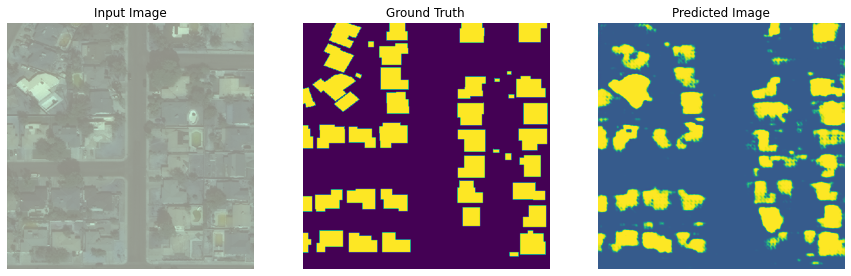

...

KeyboardInterrupt: 

In [115]:
Fit(re_inp, EPOCHS, val_re_inp)

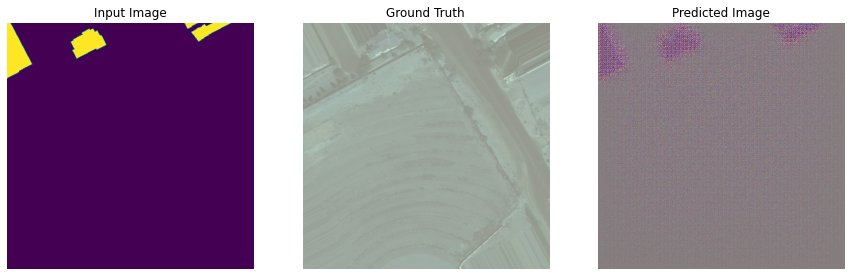

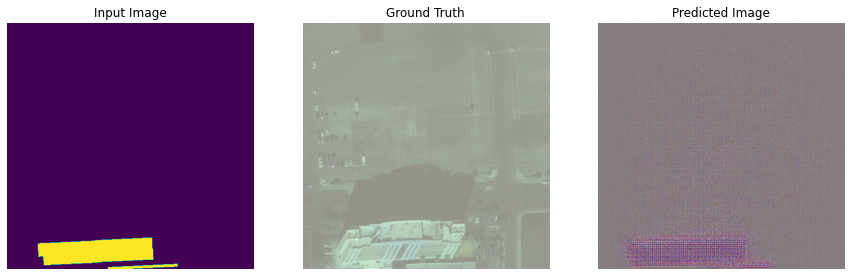

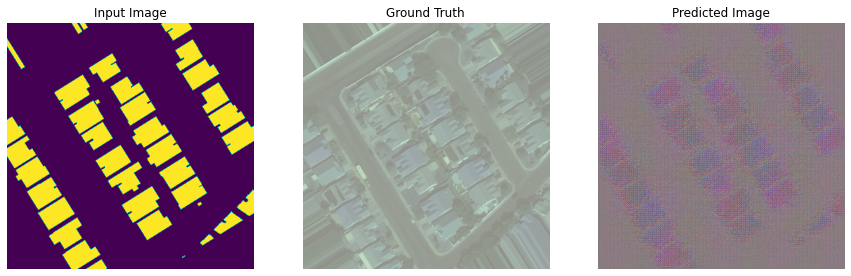

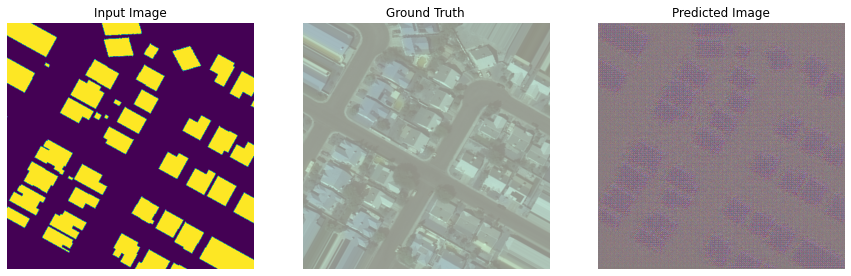

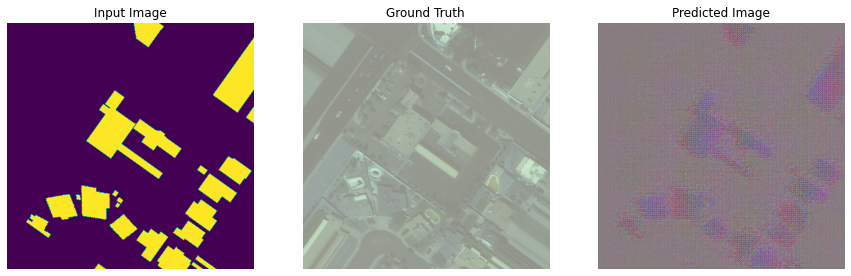

...

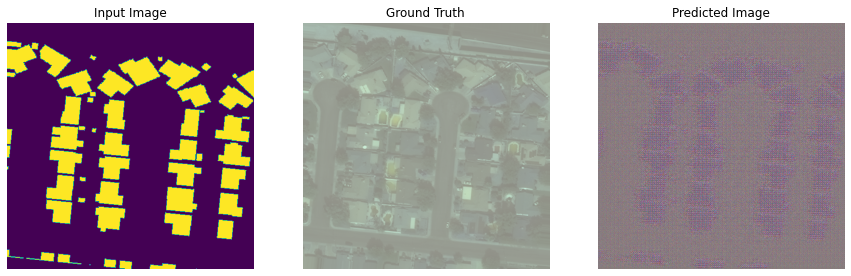

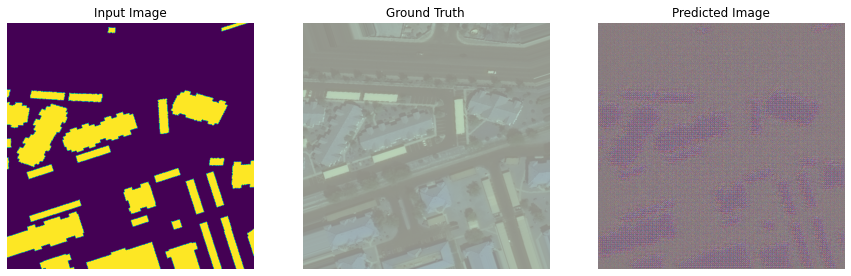

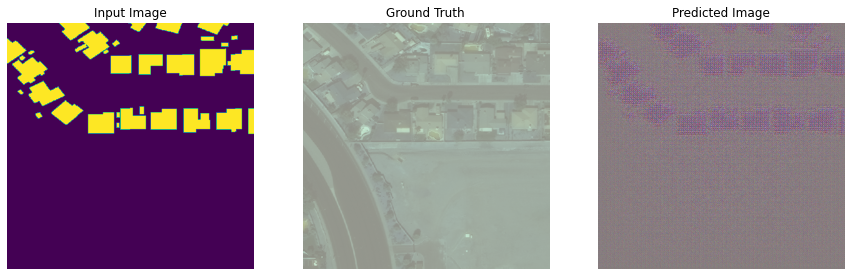

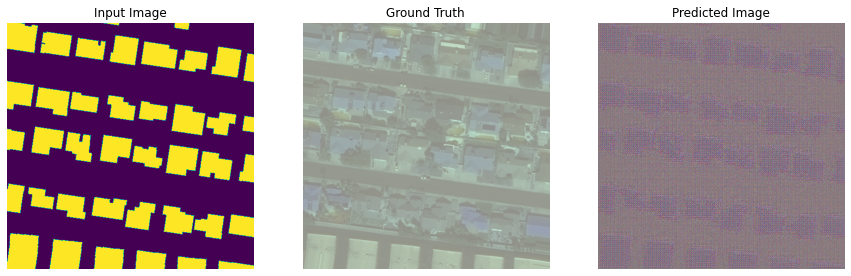

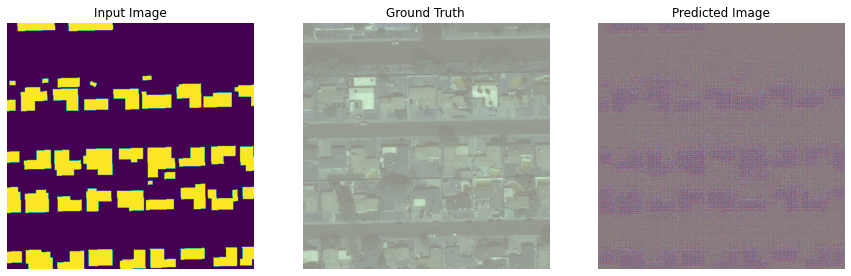

KeyboardInterrupt: 

In [89]:
fit(re_inp, EPOCHS, val_re_inp)

In [ ]:
# example of defining a composite model for training the generator model

# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_src_image = Input(shape=image_shape)
    # target image input
    in_target_image = Input(shape=image_shape)
    # concatenate images channel-wise
    merged = Concatenate()([in_src_image, in_target_image])
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    patch_out = Activation('sigmoid')(d)
    # define model
    model = Model([in_src_image, in_target_image], patch_out)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
    return model

# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add downsampling layer
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # conditionally add batch normalization
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add upsampling layer
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
    # add batch normalization
    g = BatchNormalization()(g, training=True)
    # conditionally add dropout
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = Activation('relu')(g)
    return g

# define the standalone generator model
def define_generator(image_shape=(256,256,3)):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    e7 = define_encoder_block(e6, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    # decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
    d1 = decoder_block(b, e7, 512)
    d2 = decoder_block(d1, e6, 512)
    d3 = decoder_block(d2, e5, 512)
    d4 = decoder_block(d3, e4, 512, dropout=False)
    d5 = decoder_block(d4, e3, 256, dropout=False)
    d6 = decoder_block(d5, e2, 128, dropout=False)
    d7 = decoder_block(d6, e1, 64, dropout=False)
    # output
    g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
    # make weights in the discriminator not trainable
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False
    # define the source image
    in_src = Input(shape=image_shape)
    # connect the source image to the generator input
    gen_out = g_model(in_src)
    # connect the source input and generator output to the discriminator input
    dis_out = d_model([in_src, gen_out])
    # src image as input, generated image and classification output
    model = Model(in_src, [dis_out, gen_out])
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
    return model

# define image shape
image_shape = (512,512,3)
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

image_shape = (512,512,3)
# Build model
#model_andor_weight_path = "/home/hgamarro/DeepLearning/JB_space/models/Unet/"
model_andor_weight_path = "/mnt/hgfs/VMsharedFolder/git/final-project-landandbuildingsatimg-ccny/models/pix2pix/"

if os.path.isdir(model_andor_weight_path) & False:
    gan_model = keras.models.load_model(model_andor_weight_path+'model_unet6_base.h5')
    gan_model.load_weights(model_andor_weight_path+'weights_unet5_e02.h5')
    gan_model.summary()
    print("loaded model from file")
else:
    # define image shape
    # define the models
    d_model = define_discriminator(image_shape)
    g_model = define_generator(image_shape)
    # define the composite model
    gan_model = define_gan(g_model, d_model, image_shape)
    # summarize the model
    gan_model.summary()
    # plot the model
    print("loaded model from code")
    
gan_model.save(model_andor_weight_path+"model_gan1.h5")

In [7]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
    # unpack dataset
    trainA, trainB = dataset
    # choose random instances
    ix = randint(0, trainA.shape[0], n_samples)
    # retrieve selected images
    X1, X2 = trainA[ix], trainB[ix]
    # generate 'real' class labels (1)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

In [8]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
    # generate fake instance
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [ ]:
# select a batch of real samples
[X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)

In [ ]:
# generate a batch of fake samples
X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)

In [ ]:
# update discriminator for real samples
d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
# update discriminator for generated samples
d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)

In [ ]:
# update the generator
g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])

In [ ]:
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=1, n_patch=16):
    # unpack dataset
    trainA, trainB = dataset
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    # manually enumerate epochs
    for i in range(n_steps):
        # select a batch of real samples
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        # generate a batch of fake samples
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
        # update discriminator for real samples
        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        # update discriminator for generated samples
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        # update the generator
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
        # summarize performance
        print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))

In [ ]:
# load image data
dataset = ...
# train model
train(d_model, g_model, gan_model, dataset)

### beginning of local datagenerators

In [9]:
os.getcwd()

'/home/hgamarro/DeepLearning/JB_space/notebooks/scratch'

### beginning of server datagenerators

In [10]:
class DataGenerator(Sequence):
    def __init__(self, list_IDs,label_map , img_dir ,mode):
        'Initialization'
        self.list_IDs = list_IDs
        self.label_map = image_label_map
        self.on_epoch_end()
        self.img_dir = img_dir + "/images"
        self.mask_dir = img_dir + "/masks"
        self.mode = mode

    def __len__(self):
        return int(len(self.list_IDs))

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
    
    def __getitem__(self, index):
        'Generate one batch of data'
        indexes = self.indexes[index:(index+1)]
        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        # Generate data
        X, y = self.__data_generation(list_IDs_temp)
        return X, y    
    
    def __data_generation(self, list_IDs_temp):
        """Generates data containing batch_size samples"""
        if self.mode == "train":
            # Generate data
            X, y = self.load_file(list_IDs_temp)
            return X, y
        elif self.mode == "val":
            X, y = self.load_file(list_IDs_temp)
            return X, y        
        
    def load_file(self, id_list):
        list_IDs_temp = id_list
        for ID in list_IDs_temp:
            x_file_path = os.path.join(self.img_dir, ID)
            y_file_path = os.path.join(self.mask_dir, self.label_map.get(ID))
            # Store sample
            X = np.load(x_file_path)
            # Store class
            y = np.load(y_file_path).astype('float32')
        return X, y    

In [11]:
out_train_data_dir = '/home/hgamarro/DeepLearning/HG_space/data/processed/Vegas/train'
out_val_data_dir = '/home/hgamarro/DeepLearning/HG_space/data/processed/Vegas/val'

In [12]:
# ====================
# train set
# ====================
all_files = [s for s in os.listdir(out_train_data_dir + "/images/") if s.endswith('.npy')]
all_files.append([s for s in os.listdir(out_train_data_dir + "/masks/") if s.endswith('.npy')] )

image_label_map = {
        "image_file_{}.npy".format(i+1): "label_file_{}.npy".format(i+1)
        for i in range(int(len(all_files)))}
partition = [item for item in all_files if "image_file" in item]

# ====================
# validation set
# ====================
all_val_files = [s for s in os.listdir(out_val_data_dir + "/images/") if s.endswith('.npy')]
all_val_files.append([s for s in os.listdir(out_val_data_dir + "/masks/") if s.endswith('.npy')] )
val_image_label_map = {
        "image_file_{}.npy".format(i+1): "label_file_{}.npy".format(i+1)
        for i in range(int(len(all_val_files)))
}
val_partition = [item for item in all_val_files if "image_file" in item]

In [13]:
train_generator = DataGenerator(partition,image_label_map,out_train_data_dir, "train")
val_generator= DataGenerator(val_partition,val_image_label_map,out_val_data_dir, "val")

### datagenerator proof of function

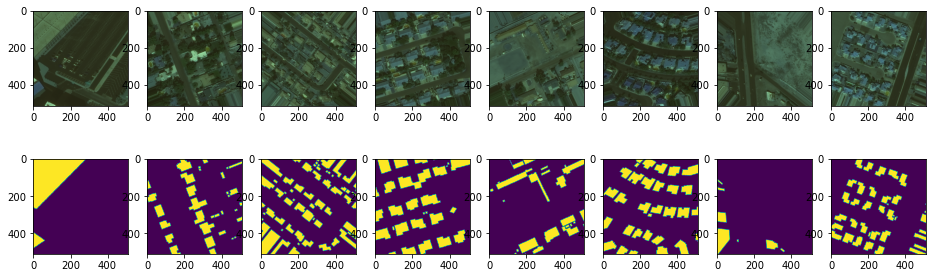

In [14]:
fig, axes = plt.subplots(2, 8, figsize=(16, 5))
# fig.subplots_adjust(hspace=0.1)

for a in np.arange(0,8):
    
    image = train_generator[5][0][a+5,:,:,:]

    # Load masks
    mask = train_generator[5][1][a+5,:,:,:]
    axes[0, a].imshow( image)
    axes[1, a].imshow( mask)

In [11]:
np.histogram(train_generator[22][0][a+5,:,:,:])

(array([ 23668, 275846, 331015, 109239,  35147,   8243,   1943,    901,
           259,    171]),
 array([0.00390991, 0.09049501, 0.17708011, 0.26366523, 0.35025033,
        0.4368354 , 0.5234205 , 0.6100056 , 0.6965907 , 0.7831758 ,
        0.86976093], dtype=float32))

In [12]:
print(np.histogram(train_generator[14][1][a+5,:,:,:]))

print(train_generator[14][1][a+5,:,:,:].dtype)

(array([223487,      0,      0,      0,      0,      0,      0,      0,
            0,  38657]), array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
      dtype=float32))
float32


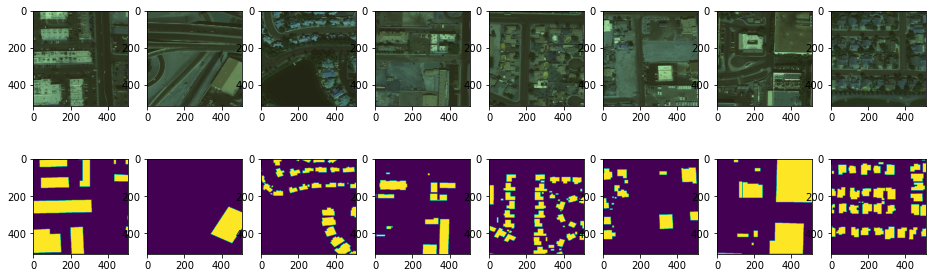

In [13]:
fig, axes = plt.subplots(2, 8, figsize=(16, 5))
# fig.subplots_adjust(hspace=0.1)

for a in np.arange(0,8):
    
    image = val_generator[5][0][a+5,:,:,:]

    # Load masks
    mask = val_generator[5][1][a+5,:,:,:]
    axes[0, a].imshow( image)
    axes[1, a].imshow( mask)

In [ ]:
rng = image[layer_idx][0,:,:,channel_idx]
rng = rng.reshape(rng.shape[0]*rng.shape[1])
plt.hist(rng, bins='auto')
plt.show

In [14]:
np.histogram(val_generator[14][0][a+5,:,:,:])

(array([  8335, 177047, 297388, 194598,  80858,  18376,   6804,   2280,
           689,     57]),
 array([0.01176471, 0.09764706, 0.1835294 , 0.26941177, 0.3552941 ,
        0.44117647, 0.52705884, 0.6129412 , 0.6988235 , 0.7847059 ,
        0.87058824], dtype=float32))

In [15]:
print(np.histogram(val_generator[14][1][a+5,:,:,:]))

print(val_generator[14][1][a+5,:,:,:].dtype)

(array([202068,      0,      0,      0,      0,      0,      0,      0,
            0,  60076]), array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
      dtype=float32))
float32


### model start

In [14]:
BATCH_SIZE = 32
LR = 0.001
EPOCHS = 15

n_classes = 1  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

# define optomizer
optim = keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
unet.compile(optim, total_loss, metrics)

# define callbacks for learning rate scheduling and best checkpoints saving

model_andor_weight_path = "/home/hgamarro/DeepLearning/JB_space/models/Unet/"
callbacks = [
    keras.callbacks.ModelCheckpoint(filepath = model_andor_weight_path+'best_weights_unet5_e{epoch:02d}.h5'
                                    ,save_freq = 'epoch'
                                    ,verbose = 1
                                    ,save_weights_only=True
                                    ,save_best_only=False
                                    ,mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

earlystop = EarlyStopping(monitor='iou_score'
                         ,min_delta = .01
                         ,patience=3)

In [ ]:
start = datetime.now()
print("start: " ,start)

history = unet.fit(
    train_generator, 
    steps_per_epoch=1, 
    epochs=EPOCHS, 
    callbacks=[callbacks, earlystop] 
    #validation_data=val_generator, 
    validation_steps=len(val_generator),
    use_multiprocessing=True
)

end = datetime.now()
print("end: " ,end)
print("\nTime Taken for testing: %s" % (end-start))

unet.save(model_andor_weight_path+"model_unet5.h5")

In [25]:
keras.backend.clear_session()

In [ ]:
get_layer(layer_name).outputs

In [119]:
#copies all layers of model
activation_layers = [layer.output for layer in unet.layers]
# Creates a model that will return these outputs, given the model input
activation_model = models.Model(inputs=unet.input, outputs=activation_layers)
# Returns a list of five Numpy arrays: one array per layer activation
print ("num of layers: " ,len(activation_layers))
activation_model.summary()

num of layers:  72
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 32) 0           batch_normalization[0][0]        
___________________________________________________________________________

In [12]:
datapath = "/mnt/hgfs/VMsharedFolder/git/misc"
x_path = "/npy"
y_path = "/masks"

input_imgs_path = datapath + x_path
target_imgs_path = datapath + y_path

x=[]
y=[]

#tempxx = np.load(datapath+'/image_file_14.npy')
#tempxx = np.load(datapath+'/label_file_14.npy')

input_img_paths = sorted(
    [
        os.path.join(input_imgs_path ,fname)
        for fname in os.listdir(input_imgs_path)
        if fname.endswith(".npy")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(target_imgs_path, fname)
        for fname in os.listdir(target_imgs_path)
        if fname.endswith(".npy") and not fname.startswith(".")
        
    ]
)

for npy in input_img_paths:
    x.append(np.load(npy))
    print(npy)

for npy in target_img_paths:
    y.append(np.load(npy))
    print(npy)
    
x = np.array(x)
y = np.array(y)
#x = x [: ,:512 ,:512 ,:]
#y = y[: ,:512 ,:512]

#img_size = x_train[0][0].shape
print(x.shape)
print(y.shape)

/mnt/hgfs/VMsharedFolder/git/misc/npy/image_file_14.npy
/mnt/hgfs/VMsharedFolder/git/misc/npy/image_file_84.npy
/mnt/hgfs/VMsharedFolder/git/misc/masks/label_file_14.npy
/mnt/hgfs/VMsharedFolder/git/misc/masks/label_file_84.npy
(2, 32, 512, 512, 3)
(2, 32, 512, 512, 1)


In [13]:
print(x[0][4].shape)
print(y[0][4].shape)

(512, 512, 3)
(512, 512, 1)


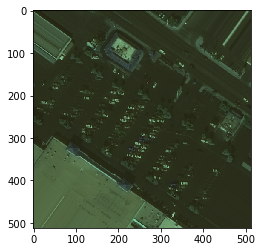

In [14]:
plt.imshow(x[0][4])

In [15]:
print(y[0].shape)
print(y[0][:2].shape)
print(y[0][4 ,: ,: ,0].shape)

(32, 512, 512, 1)
(2, 512, 512, 1)
(512, 512)


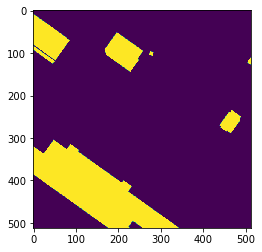

In [16]:
plt.imshow(y[0][4 ,: ,: ,0])

(512, 512, 3)
temp1 (1, 512, 512, 3)
pred2 (1, 512, 512, 1)
pred3 (512, 512, 1)


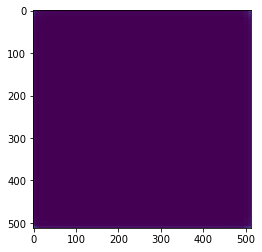

In [115]:
idx = 30
temp = x[0][idx ,: ,: ,:]
print(temp.shape)
#temp = np.expand_dims(x[idx] ,axis=0)
#temp = x_train[idx]
temp = np.expand_dims(temp ,axis=0)
print("temp1" ,temp.shape)

def axis_i(arr, axis, i):
    idx = (np.s_[:],) * axis + (i,)
    return arr[idx]

temp_pred = np.array(unet.predict(temp))
#temp_pred = activation_model.predict(temp)
print("pred2" ,temp_pred.shape)
temp_pred = axis_i(temp_pred ,0 ,0)
print("pred3" ,temp_pred.shape)

#print(temp_pred)
#for i in np.arange(0 ,temp_pred[-1].shape[1]):
    #plt.figure().add_subplot(1 ,2 ,i+1)
plt.imshow(temp_pred[:,:,i])

# of layers  72

pred shape: (1, 256, 256, 32)
conv2d_transpose_7


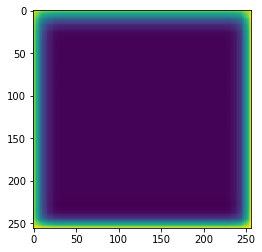

In [121]:
#proving that the model has been copied over
# Returns a list of arrays: one array per layer activation
temp_pred = activation_model.predict(temp)
print("# of layers " ,len(temp_pred))

# One activation layer example as numpy array
layer_idx = 65
print("\npred shape:" ,temp_pred[layer_idx].shape)
channel_idx = 0
plt.imshow(temp_pred[layer_idx][0,:,:,channel_idx] )
print(activation_model.layers[layer_idx].name)

<function matplotlib.pyplot.show(*args, **kw)>

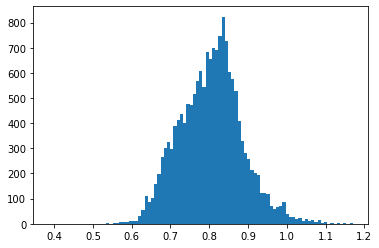

In [94]:
rng = temp_pred[layer_idx][0,:,:,channel_idx]
rng = rng.reshape(rng.shape[0]*rng.shape[1])
plt.hist(rng, bins='auto')
plt.show

In [ ]:
del rng

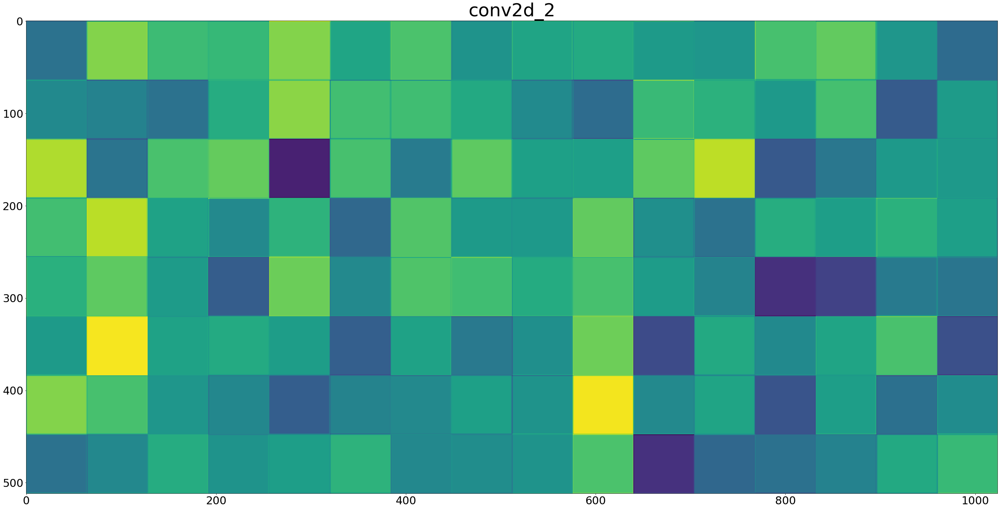

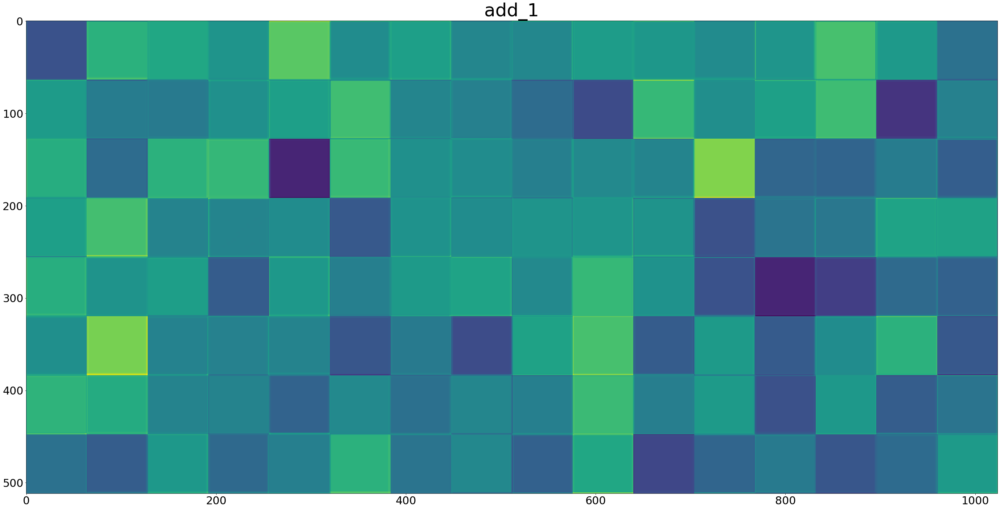

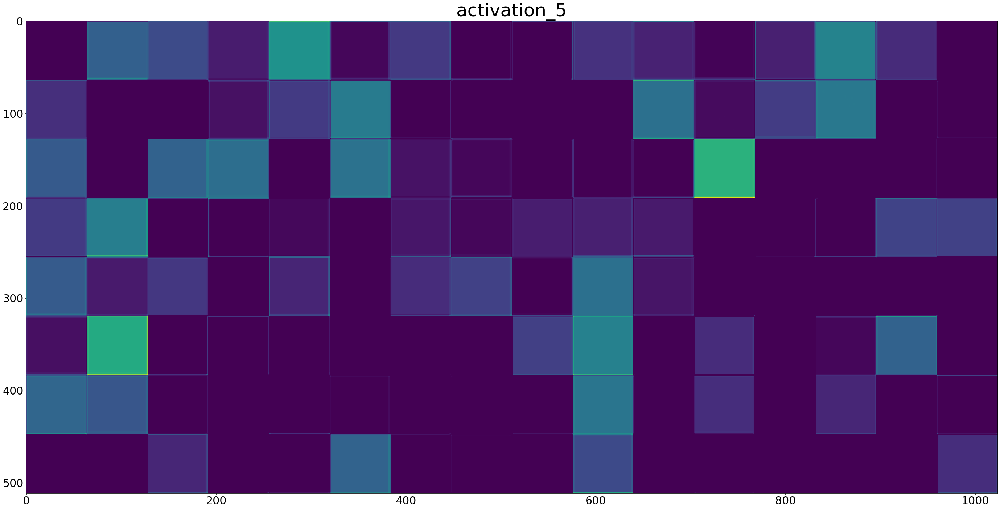

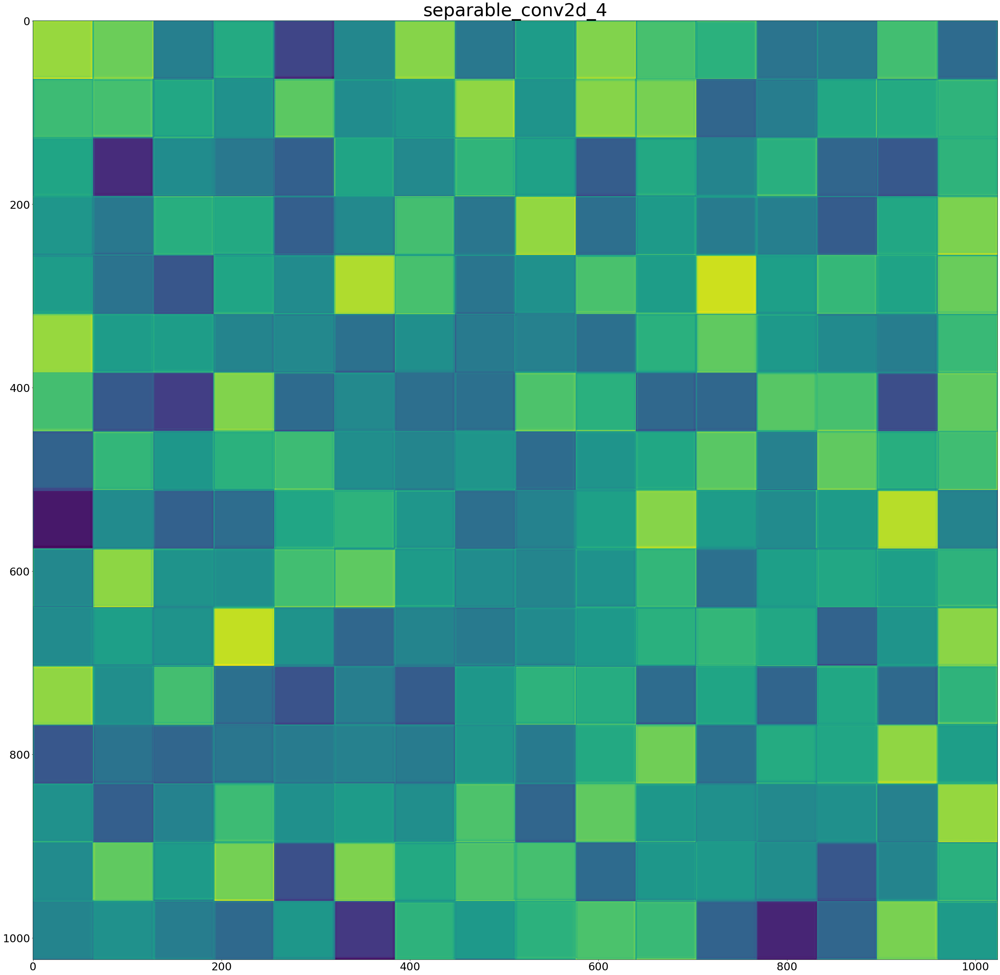

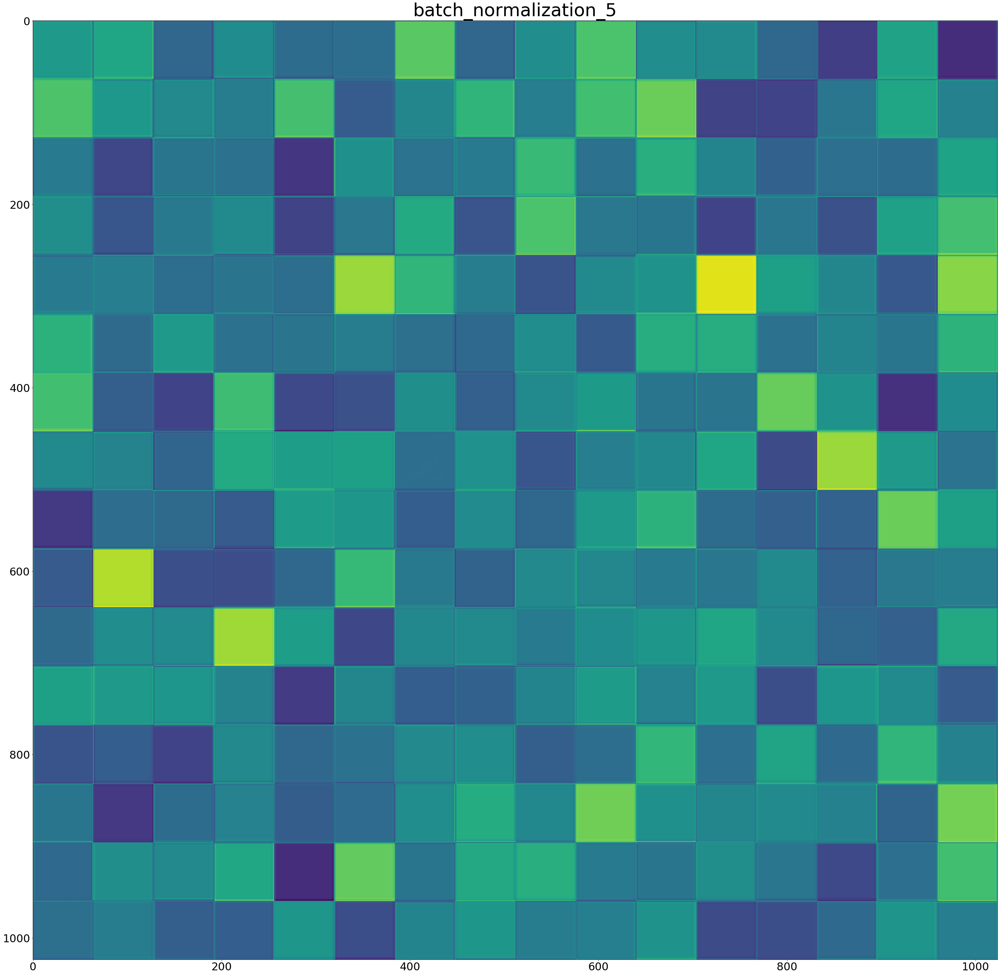

...

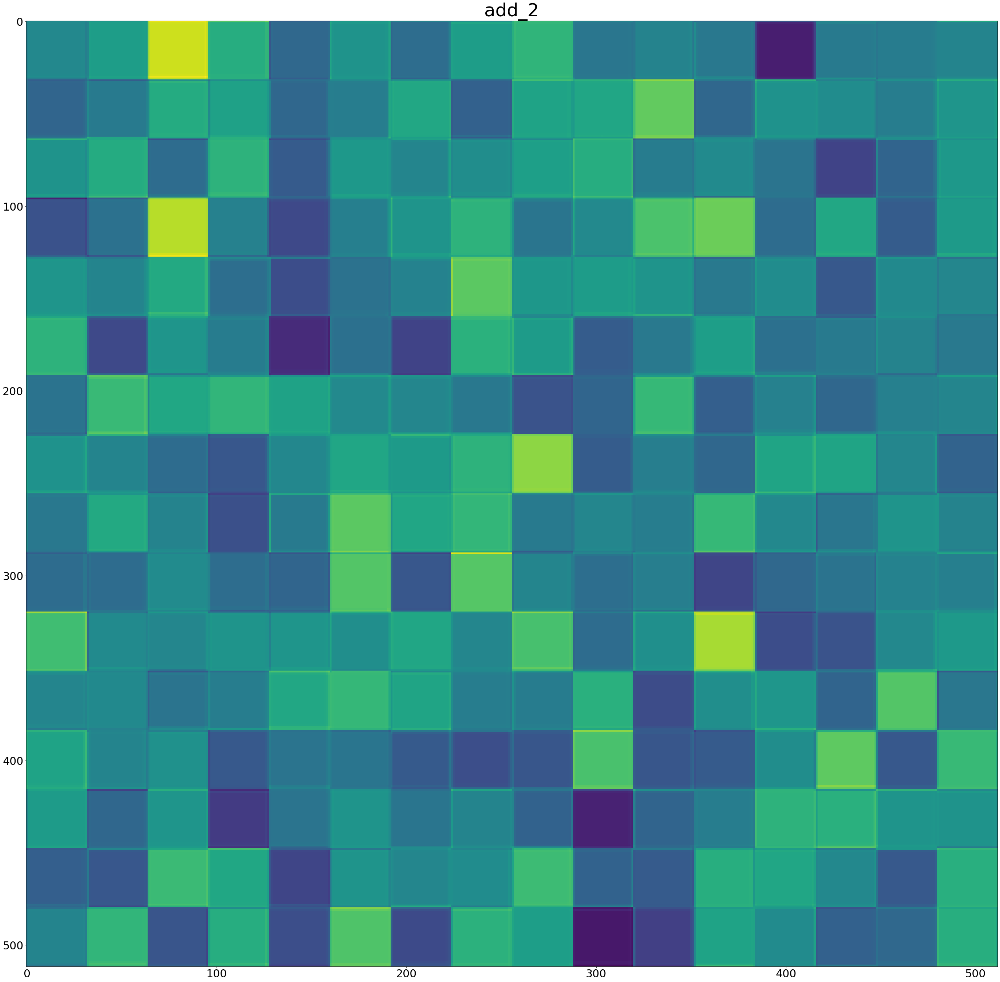

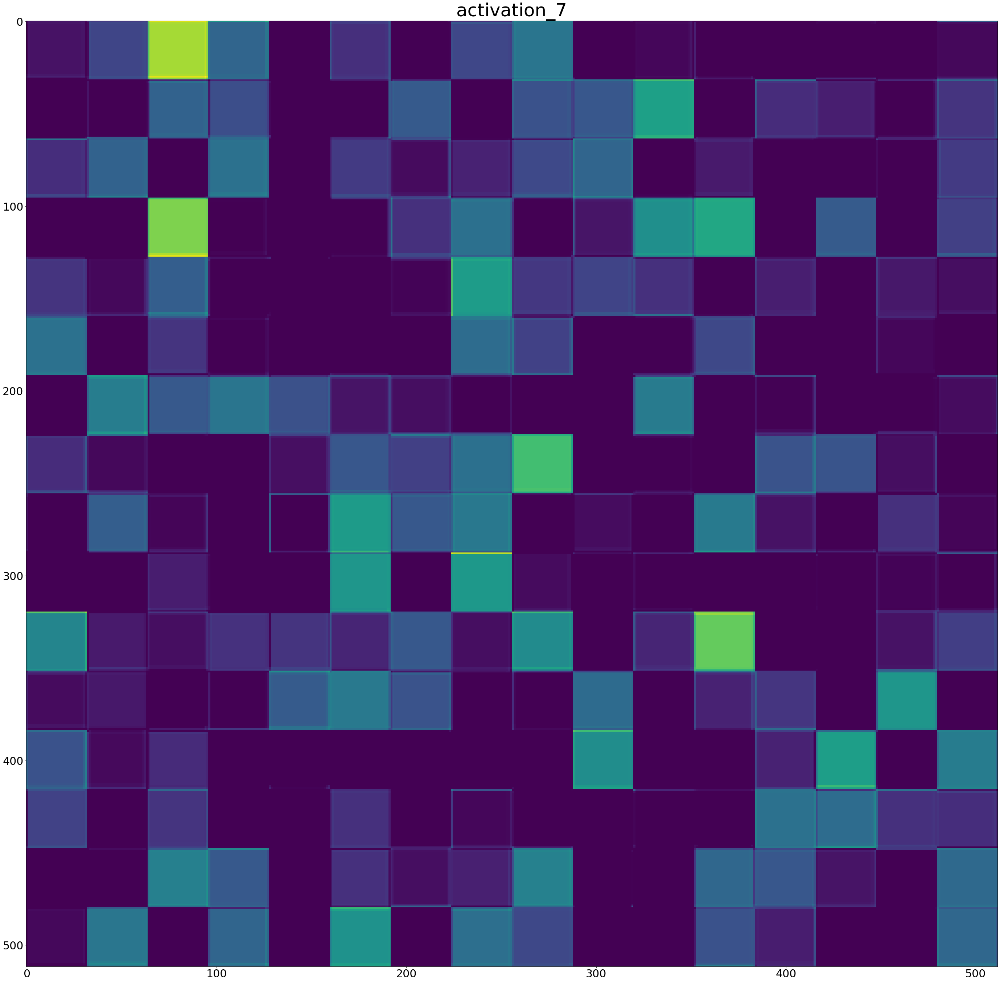

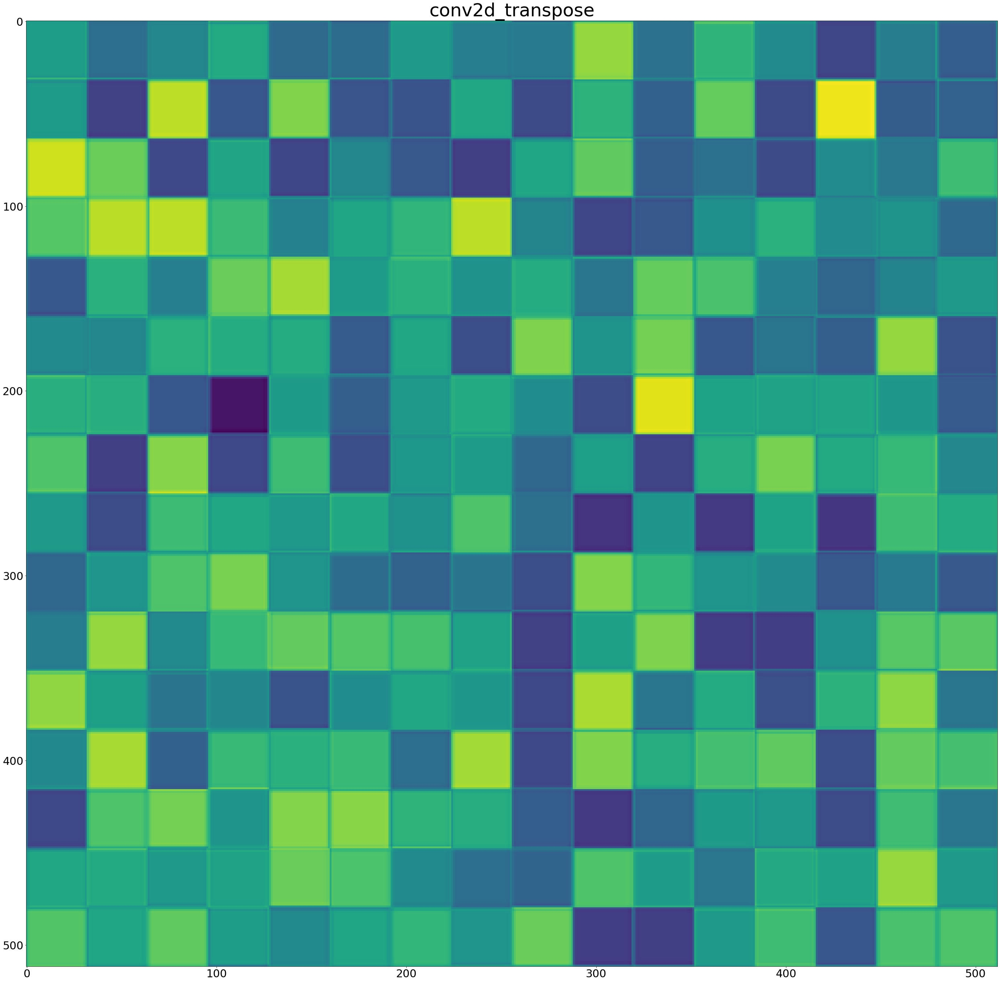

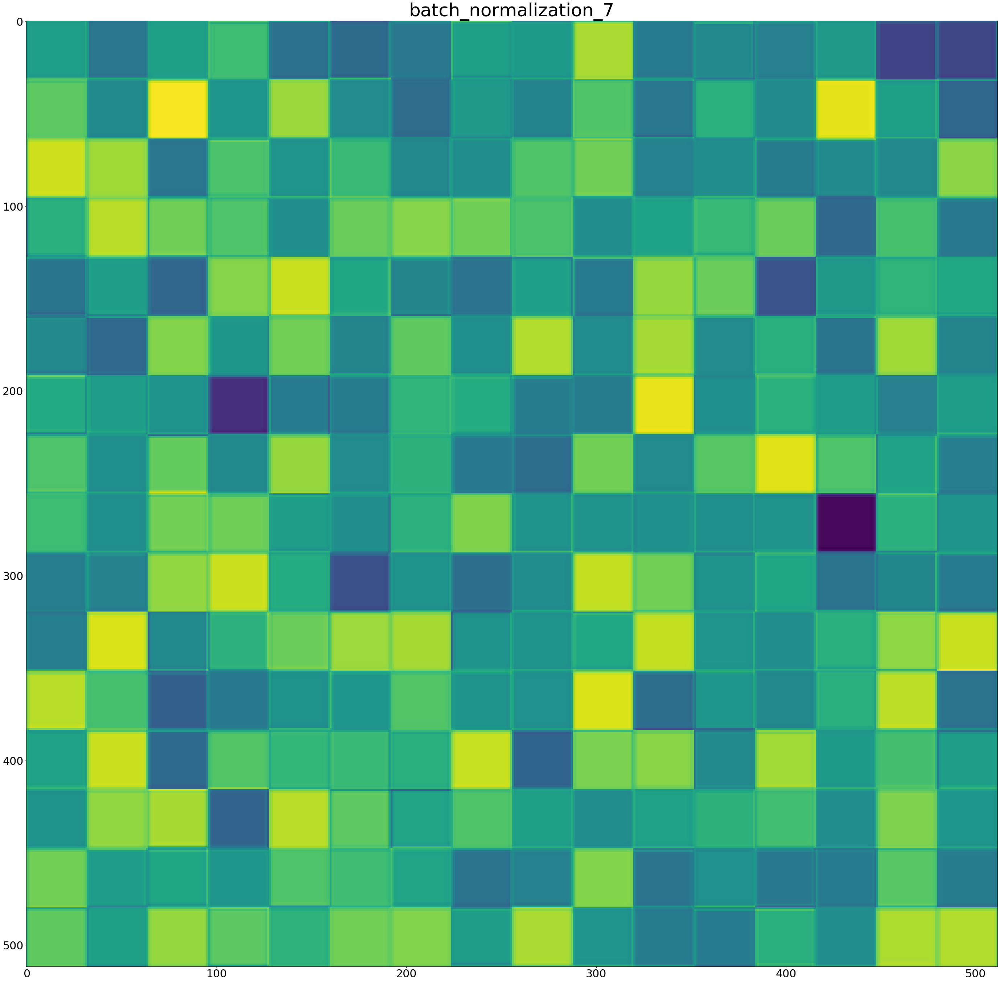

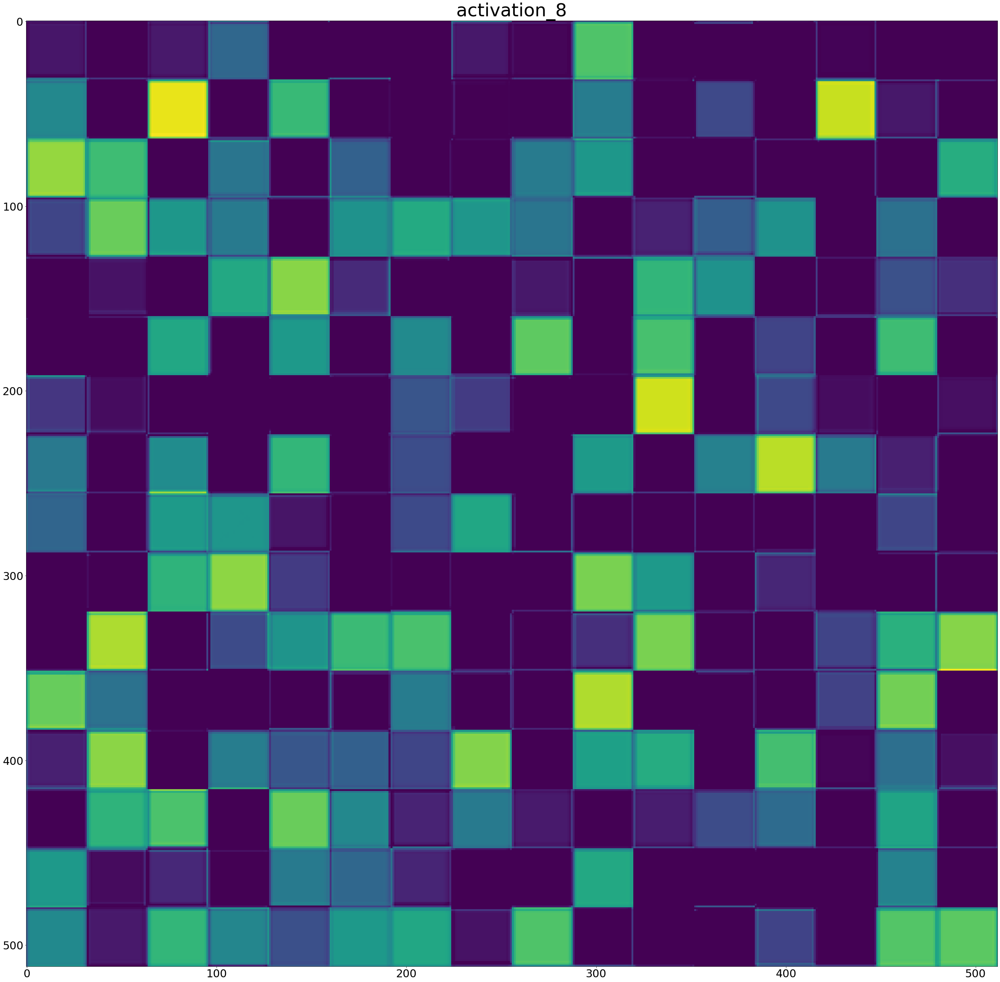

In [125]:
#warnings.filterwarnings(action="ignore" ,category=UserWarning)

# Extracts the outputs starting at x layer
x_layers = 20 #56
x_range = 15
layer_names = []
for layer in activation_model.layers[x_layers:x_layers+x_range]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, temp_pred[x_layers:x_layers+x_range]): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    '''print("\n1~activation_shape " ,layer_activation.shape)
    print("n_features " ,n_features)
    print("size " ,size)
    print("n_cols " ,n_cols)
    print("display_grid " ,size * n_cols ," ; " ,images_per_row * size)
    print("2~layername " ,layer_name)'''
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            '''channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            #channel_image /= channel_image.std()
            channel_image *= 3
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')'''
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 3. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name,fontsize=50)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto' #,cmap='viridis'
              )

#warnings.filterwarnings(action='default')

In [ ]:
#how to overlay 2 channel predictions?

### scratch section

In [169]:
tempxx = np.load(datapath+'/image_file_14.npy')
tempxx = np.load(datapath+'/label_file_14.npy')
tempxx.shape

(32, 512, 512, 1)

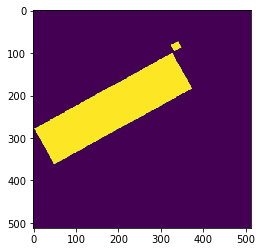

In [213]:
plt.imshow(tempxx[0,:,:,0])

<function matplotlib.pyplot.show(*args, **kw)>

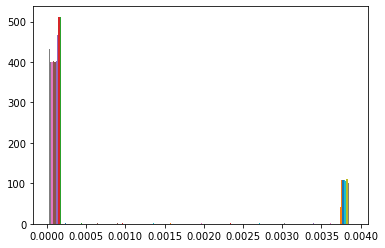

In [228]:
tempxx = np.load(datapath+'/label_file_14.npy')
rng = tempxx[0,:,:,0]
plt.hist(rng, bins='auto')
plt.show

In [222]:

unique_elements, counts_elements = np.unique((tempxx[0,:,:,0]) ,return_counts=True)
print(np.asarray((tempxx[0,:,:,0], counts_elements)))
print("\nFrequency of unique values of the said array:")
print(np.asarray((unique_elements, counts_elements)))

[array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
 array([225776,      1,      1, ...,      1,      1,  35346])]

Frequency of unique values of the said array:
[[0.00000000e+00 7.20379512e-06 8.93098240e-06 ... 3.91766243e-03
  3.91986361e-03 3.92156886e-03]
 [2.25776000e+05 1.00000000e+00 1.00000000e+00 ... 1.00000000e+00
  1.00000000e+00 3.53460000e+04]]


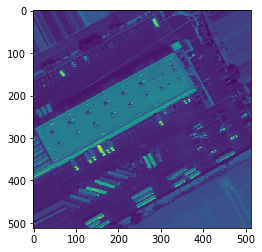

In [168]:
plt.imshow(tempxx[0,:,:,0])

In [ ]:
def Printthis(df ,ind=False ,elems=5 ,rows=10 ,columns=None ,rand=False ,prt=False):
    if prt == True:
        with pd.option_context('display.max_rows', None
                               , 'display.max_columns', None
                               ,'display.width', None
                              ,'display.max_colwidth', None):
            print (df)
    else:
        size = len(df)

        if ind==True:
            return index
        elif rand == False:
            with pd.option_context('display.max_rows', rows
                                   , 'display.max_columns', columns
                                   ,'display.width', None
                                  ,'display.max_colwidth', None):
                print (df.iloc[:rows])
        else:
            index = np.random.permutation(size)[:elems]
            with pd.option_context('display.max_rows', rows
                                   , 'display.max_columns', columns
                                   ,'display.width', None
                                  ,'display.max_colwidth', None):
                print (df.iloc[index])